# Riyadh Villas Aqar Dataset

## Import needed Librarys 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [2]:
import arabic_reshaper
import sys
from bidi.algorithm import get_display

In [3]:
import locale
#Get information on the actual locale setting:
locale.setlocale(locale.LC_ALL,'ar_EG')

'ar_EG'

# EDA Steps

## Read the Dataset 

In [4]:
df = pd.read_csv('RiyadhVillasAqar.csv')
df

C:\Users\albgm\AppData\Local\Temp\ipykernel_9992\2877637968.py:1: DtypeWarning: Columns (16) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('RiyadhVillasAqar.csv')


,Unnamed: 0,front,rooms,lounges,bathrooms,streetWidth,stairs,propertyAge,driverRoom,tent,...,apartments,maidRoom,elevator,furnihsed,pool,basement,neighbourhood,location,price,square price
0,0,شرقية,5,4.0,5+,20.0,1.0,0.0,1.0,1.0,...,0,0.0,0.0,0.0,0.0,0.0,عكاظ,جنوب الرياض,1050000.0,3500.000000
1,1,غربية,4,3.0,5+,20.0,1.0,0.0,1.0,1.0,...,2.0,1.0,1.0,0.0,0.0,0.0,المهدية,غرب الرياض,3000000.0,5555.555556
2,2,جنوبية شرقية,7,2.0,5+,15.0,1.0,31.0,1.0,0.0,...,0,1.0,0.0,0.0,0.0,0.0,الشفا,جنوب الرياض,2000000.0,2285.714286
3,3,غربية,7,3.0,5+,15.0,1.0,3.0,0.0,1.0,...,0,1.0,0.0,1.0,0.0,0.0,ظهرة لبن,غرب الرياض,894000.0,4470.000000
4,4,شمالية,4,2.0,4,25.0,1.0,0.0,1.0,1.0,...,3.0,1.0,1.0,1.0,0.0,0.0,قرطبة,شرق الرياض,3500000.0,8750.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46821,51840,جنوبية,5,2,5+,20.0,1.0,0.0,0.0,1.0,...,1.0,1.0,1.0,0.0,0.0,0.0,المونسية,شرق الرياض,2250000.0,5844.155844
46822,51841,غربية,7,2,5+,12.0,1.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,ظهرة البديعة,غرب الرياض,1050000.0,2100.000000
46823,51842,غربية,5,3,5+,20.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,طويق,غرب الرياض,1000000.0,5000.000000
46824,51843,جنوبية غربية,1,NaN,1,15.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,النهضة,شرق الرياض,2300000.0,5679.012346


In [5]:
df.info()
# lounges - bathrooms - driverRoom should be boolean - apartments should be integer -space should be float

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46826 entries, 0 to 46825
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     46826 non-null  int64  
 1   front          46826 non-null  object 
 2   rooms          46826 non-null  int64  
 3   lounges        45708 non-null  object 
 4   bathrooms      46826 non-null  object 
 5   streetWidth    46636 non-null  float64
 6   stairs         46826 non-null  float64
 7   propertyAge    46826 non-null  float64
 8   driverRoom     46826 non-null  float64
 9   tent           46826 non-null  float64
 10  patio          46826 non-null  float64
 11  kitchen        46826 non-null  float64
 12  outdoorRoom    46826 non-null  float64
 13  garage         46826 non-null  float64
 14  duplex         46826 non-null  float64
 15  space          46826 non-null  int64  
 16  apartments     46826 non-null  object 
 17  maidRoom       46826 non-null  float64
 18  elevat

In [6]:
df.head()

,Unnamed: 0,front,rooms,lounges,bathrooms,streetWidth,stairs,propertyAge,driverRoom,tent,...,apartments,maidRoom,elevator,furnihsed,pool,basement,neighbourhood,location,price,square price
0,0,شرقية,5,4.0,5+,20.0,1.0,0.0,1.0,1.0,...,0,0.0,0.0,0.0,0.0,0.0,عكاظ,جنوب الرياض,1050000.0,3500.000000
1,1,غربية,4,3.0,5+,20.0,1.0,0.0,1.0,1.0,...,2.0,1.0,1.0,0.0,0.0,0.0,المهدية,غرب الرياض,3000000.0,5555.555556
2,2,جنوبية شرقية,7,2.0,5+,15.0,1.0,31.0,1.0,0.0,...,0,1.0,0.0,0.0,0.0,0.0,الشفا,جنوب الرياض,2000000.0,2285.714286
3,3,غربية,7,3.0,5+,15.0,1.0,3.0,0.0,1.0,...,0,1.0,0.0,1.0,0.0,0.0,ظهرة لبن,غرب الرياض,894000.0,4470.000000
4,4,شمالية,4,2.0,4,25.0,1.0,0.0,1.0,1.0,...,3.0,1.0,1.0,1.0,0.0,0.0,قرطبة,شرق الرياض,3500000.0,8750.000000


In [7]:
df.describe()

,Unnamed: 0,rooms,streetWidth,stairs,propertyAge,driverRoom,tent,patio,kitchen,outdoorRoom,garage,duplex,space,maidRoom,elevator,furnihsed,pool,basement,price,square price
count,46826.000000,46826.000000,46636.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,46826.000000,4.682400e+04,46824.000000
mean,25915.132384,4.687439,18.158418,0.683979,2.454790,0.355871,0.466258,0.769380,0.979114,0.645112,0.907872,0.297698,380.021740,0.767821,0.235745,0.078738,0.116410,0.037671,2.347636e+06,6088.058800
std,14993.821359,1.104970,4.167866,0.464926,6.496833,0.478781,0.498866,0.421234,0.143004,0.478485,0.289210,0.457251,281.431272,0.422227,0.424468,0.269333,0.320719,0.190402,2.782053e+06,4515.845244
min,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.080000e+03,3.428571
25%,12925.250000,4.000000,15.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,270.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.180000e+06,3866.666667
50%,25836.500000,5.000000,20.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,312.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.600000e+06,5000.000000
75%,38917.750000,5.000000,20.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,400.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.600000e+06,7600.000000
max,51844.000000,7.000000,100.000000,1.000000,35.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,10000.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+08,136144.578313


In [8]:
df.shape

(46826, 26)

## Check for null values

In [9]:
df.isnull().sum()


Unnamed: 0          0
front               0
rooms               0
lounges          1118
bathrooms           0
streetWidth       190
stairs              0
propertyAge         0
driverRoom          0
tent                0
patio               0
kitchen             0
outdoorRoom         0
garage              0
duplex              0
space               0
apartments          0
maidRoom            0
elevator            0
furnihsed           0
pool                0
basement            0
neighbourhood       0
location            0
price               2
square price        2
dtype: int64

## Clear the null values

In [10]:
df.dropna(subset=['lounges','streetWidth','price','square price','apartments'], inplace=True)
df.isnull().sum()


Unnamed: 0       0
front            0
rooms            0
lounges          0
bathrooms        0
streetWidth      0
stairs           0
propertyAge      0
driverRoom       0
tent             0
patio            0
kitchen          0
outdoorRoom      0
garage           0
duplex           0
space            0
apartments       0
maidRoom         0
elevator         0
furnihsed        0
pool             0
basement         0
neighbourhood    0
location         0
price            0
square price     0
dtype: int64

In [11]:
df.shape

(45534, 26)

## Change the dataset to proper types

In [12]:
columns_to_clean = ['bathrooms', 'lounges', 'apartments']
for col in columns_to_clean:
    df[col] = df[col].apply(lambda x: str(x).replace('+', '')).astype(float)
int_columns = ['lounges', 'bathrooms', 'propertyAge', 'apartments']
df[int_columns] = df[int_columns].fillna(0).astype(int)
boolean_columns = ['stairs', 'driverRoom', 'tent', 'patio', 'kitchen', 'outdoorRoom', 'garage', 'duplex',
                   'maidRoom', 'elevator', 'furnihsed', 'pool', 'basement']
df[boolean_columns] = df[boolean_columns].astype(bool)

df['space'] = df['space'].astype(float)
print(df.dtypes)

Unnamed: 0         int64
front             object
rooms              int64
lounges            int32
bathrooms          int32
streetWidth      float64
stairs              bool
propertyAge        int32
driverRoom          bool
tent                bool
patio               bool
kitchen             bool
outdoorRoom         bool
garage              bool
duplex              bool
space            float64
apartments         int32
maidRoom            bool
elevator            bool
furnihsed           bool
pool                bool
basement            bool
neighbourhood     object
location          object
price            float64
square price     float64
dtype: object


## Drop unneeded column and rename needed column

In [13]:
df.drop(['Unnamed: 0'], axis='columns', inplace=True)
df = df.rename(columns={'square price': 'square_price'})

In [14]:
df.head(100)

,front,rooms,lounges,bathrooms,streetWidth,stairs,propertyAge,driverRoom,tent,patio,...,apartments,maidRoom,elevator,furnihsed,pool,basement,neighbourhood,location,price,square_price
0,شرقية,5,4,5,20.0,True,0,True,True,True,...,0,False,False,False,False,False,عكاظ,جنوب الرياض,1050000.0,3500.000000
1,غربية,4,3,5,20.0,True,0,True,True,True,...,2,True,True,False,False,False,المهدية,غرب الرياض,3000000.0,5555.555556
2,جنوبية شرقية,7,2,5,15.0,True,31,True,False,True,...,0,True,False,False,False,False,الشفا,جنوب الرياض,2000000.0,2285.714286
3,غربية,7,3,5,15.0,True,3,False,True,True,...,0,True,False,True,False,False,ظهرة لبن,غرب الرياض,894000.0,4470.000000
4,شمالية,4,2,4,25.0,True,0,True,True,True,...,3,True,True,True,False,False,قرطبة,شرق الرياض,3500000.0,8750.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,شمالية,5,3,5,15.0,False,0,False,True,True,...,1,True,True,False,False,False,الرمال,شرق الرياض,1500000.0,5357.142857
98,جنوبية غربية,4,2,5,20.0,True,14,True,True,True,...,0,True,False,False,False,False,الفلاح,شمال الرياض,3000000.0,8241.758242
99,جنوبية,5,2,5,20.0,True,0,True,True,True,...,2,True,False,False,False,False,الرمال,شرق الرياض,2800000.0,4000.000000
100,شمالية شرقية,7,4,5,25.0,True,0,True,False,True,...,0,True,True,False,True,False,الملقا,شمال الرياض,8200000.0,11714.285714


## for dashboard purpose

In [15]:
avg=df['price'].mean()
avg
df['category']='x'
for i in df['price'].index:
    if df['price'][i]>avg:
        df['category'][i]='high'
    if df['price'][i]<avg:
        df['category'][i]='low'
    if df['price'][i]==avg:
        df['category'][i]='normal'

C:\Users\albgm\AppData\Local\Temp\ipykernel_9992\2460742810.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['category'][i]='low'
C:\Users\albgm\AppData\Local\Temp\ipykernel_9992\2460742810.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['category'][i]='high'


## Modify the names of neighborhoods

In [16]:
df['neighbourhood'].unique()

array([' عكاظ ', ' المهدية ', ' الشفا ', ' ظهرة لبن ', ' قرطبة ',
       ' السويدي ', ' الروضة ', ' القادسية ', ' بدر ',
       ' المدينة الصناعية الجديدة ', ' الجنادرية ', ' الفاخرية ',
       ' الشرق ', ' العارض ', ' الدار البيضاء ', ' الحمراء ', ' طويق ',
       ' احد ', ' النهضة ', ' الخليج ', ' اشبيلية ', ' الملك فيصل ',
       ' النسيم الغربي ', ' الرمال ', ' حطين ', ' الريان ', ' النرجس ',
       ' الحزم ', ' السلام ', ' طيبة ', 'ان مولى قريش ', ' الصحافة ',
       ' العزيزية ', ' الفلاح ', ' الملقا ', ' الرحمانية ', ' النرجس',
       ' الندوة ', ' نمار ', ' ديراب ', ' المعيزيلة ', ' ظهرة نمار ',
       ' مطار الملك خالد الدولي ', ' الغدير ', 'ه بن خليفه ',
       ' القيروان ', ' العوالي ', ' المونسية ', ' العريجاء الغربية ',
       'ى العصامي ', ' الياسمين ', ' أم الحمام الغربي ', 'ة نمار ',
       ' الربوة ', ' النخيل ', ' اليمامة ', ' اليرموك ', ' الدريهمية ',
       ' ظهرة البديعة ', 'ى الفرضي ', 'ى بن مسعود ', ' عريض ', ' النفل ',
       ' الاندلس ', ' الزهرة ', ' السلي ', 

In [17]:
n=pd.DataFrame()
n[['1','2','3','4','5','6']] = df['neighbourhood'].str.split(" ", expand = True)
n=n.drop(columns=['1','6'] )
n['4'].fillna('', inplace=True)
n['3'].fillna('', inplace=True)
n['5'].fillna('', inplace=True)

In [18]:
df['neighbourhood'] = n['2']+ ' '+n['3']+' '+ n['4']+ ' ' +n['5']
df.neighbourhood = df.neighbourhood.str.lstrip()
df.neighbourhood = df.neighbourhood.str.rstrip()

In [19]:
df['neighbourhood'].unique()

array(['عكاظ', 'المهدية', 'الشفا', 'ظهرة لبن', 'قرطبة', 'السويدي',
       'الروضة', 'القادسية', 'بدر', 'المدينة الصناعية الجديدة',
       'الجنادرية', 'الفاخرية', 'الشرق', 'العارض', 'الدار البيضاء',
       'الحمراء', 'طويق', 'احد', 'النهضة', 'الخليج', 'اشبيلية',
       'الملك فيصل', 'النسيم الغربي', 'الرمال', 'حطين', 'الريان',
       'النرجس', 'الحزم', 'السلام', 'طيبة', 'مولى قريش', 'الصحافة',
       'العزيزية', 'الفلاح', 'الملقا', 'الرحمانية', 'الندوة', 'نمار',
       'ديراب', 'المعيزيلة', 'ظهرة نمار', 'مطار الملك خالد الدولي',
       'الغدير', 'بن خليفه', 'القيروان', 'العوالي', 'المونسية',
       'العريجاء الغربية', 'العصامي', 'الياسمين', 'أم الحمام الغربي',
       'الربوة', 'النخيل', 'اليمامة', 'اليرموك', 'الدريهمية',
       'ظهرة البديعة', 'الفرضي', 'بن مسعود', 'عريض', 'النفل', 'الاندلس',
       'الزهرة', 'السلي', 'البيان', 'الندى', 'الخير', 'الروابي', 'العقيق',
       'بن عساكر', 'سلطانة', 'السعادة', 'قاضي', 'الواحة', 'العليا',
       'الملك فهد', 'المروة', 'بن عبدالله', 'السويدي 

# Data Visualization

## choosing one color palette all charts

In [20]:
co=['#637135','#414b1d','#676f4a','#8d9377','#b3b7a5','#d9dbd2','#aab29f','#c2cfb2','#b1c4b4','#bfc099','#bfc099']

## Chart 1 : تأثير اتجاه البيت الجغرافي على الاسعار

In [38]:
plt.figure(figsize=(10,10))


fig1=px.histogram(data_frame=df,x='front',y='price',color_discrete_sequence=co,
                 title='تأثير اتجاه البيت الجغرافي على الاسعار',
                 labels={
                     "front": "اتجاه البيت",
                     "price": "الأسعار",
#                      "front": "الاتجاه"
                     } )

fig1.update_layout(
#     plot_bgcolor='rgb(245,245,245)',
    autosize=False,
    title = {'xanchor': 'center','x':0.5},
    xaxis_title='اتجاه البيت',
    yaxis_title='الأسعار',
    title_font_size=24,
    
    font=dict(size=15),
    width=900,
    height=600,
)

fig1.show()
# could be an insight

<Figure size 1000x1000 with 0 Axes>

## insight :
 
###  الفلل ذات الواجهة الشمالية تكون اعلى سعراً بسبب عدم تأثرها بالعوامل الطبيعية مثل اشعة الشمس و الرياح
### الفلل ذات الواجهة الغربية تكون الاقل سعراً بسبب تأثرها بالعوامل الطبيعية مثل الشمس و الرياح     

## Chart 2 : الفلل الاكبر والاصغر من عمر 5 سنوات 

In [23]:
more = (df['propertyAge'] >= 5)
more = df.loc[more, ['propertyAge', 'location']]

less = (df['propertyAge'] < 5)
less = df.loc[less, ['propertyAge', 'location']]

fig2 = px.pie(more, names='location', title='الفلل الاكبر من عمر 5 سنوات',color_discrete_sequence=co)
fig2.update_layout(
#     plot_bgcolor='rgb(245,245,245)',
    autosize=False,
    title = {'xanchor': 'center','x':0.5},
    title_font_size=24,
    font=dict(size=15),
    width=900,
    height=600,
)
fig2.show()

fig22 = px.pie(less, names='location', title='الفلل الاصغر من 5 سنوات ',color_discrete_sequence=co)
fig22.update_layout(
#     plot_bgcolor='rgb(245,245,245)',
    autosize=False,
    title = {'xanchor': 'center','x':0.5},
    title_font_size=24,
    font=dict(size=15),
    width=900,
    height=600,
)
fig22.show()

## insight :

###  الفلل في المنطقة الشرق تعتبر الأقدم من المناطق الأخرى 
### الفلل في المنطقة تعتبر الأجدد من المناطق الأخرى  

## Chart 3 : سعر المتر لكل منطقة

In [24]:
mean_square_price = df.groupby('location')['square_price'].mean().reset_index()

pie_fig3 = px.pie(mean_square_price, names='location', values='square_price',
                 title='سعر المتر لكل منطقة',color_discrete_sequence=co)
pie_fig3.update_layout(
#     plot_bgcolor='rgb(245,245,245)',
    autosize=False,
    title = {'xanchor': 'center','x':0.5},
#     xaxis_title='اتجاه البيت',
#     yaxis_title='الأسعار',
    title_font_size=24,
    
    font=dict(size=15),
    width=900,
    height=600,
)

pie_fig3.show()

## insight :

### سعر المتر في شمال الرياض يعتبر الأعلى من باقي المناطق

## Chart 4 : عدد الفلل ذات المميزات الكاملة في كل منطقة

In [25]:
df['full']=0
df['new'] = (df['driverRoom'] == True) & (df['tent'] == True)& (df['patio'] == True)& (df['outdoorRoom'] == True)& (df['maidRoom'] == True)& (df['elevator'] == True)& (df['basement'] == True)& (df['pool'] == True)

In [26]:
a=df[(df['new'] == True)]
fig4 = px.histogram(a, x='location',color_discrete_sequence=co, title='عدد الفلل ذات المميزات الكاملة في كل منطقة')

                 

fig4.update_layout(
#     plot_bgcolor='rgb(245,245,245)',
    autosize=False,
    title = {'xanchor': 'center','x':0.5},
    xaxis_title='المنطقة',
    yaxis_title='العدد',
    title_font_size=24,
    
    font=dict(size=15),
    width=900,
    height=600,
)
fig4.show()


## insight :

### اعداد الفلل الفاخرة تتواجد بكثره في شمال الرياض

## Chart 5 : العلاقة بين عمر الفلل والأسعار

In [39]:
data = df[(df['location'] == 'شرق الرياض') & (df['propertyAge'] < df['propertyAge'].mean() )]
fig5=px.histogram(x='price',y='propertyAge',data_frame=data,color_discrete_sequence=co,title='اسعار الفلل في شرق الرياض وأعمارها')
fig5.update_layout(
#     plot_bgcolor='rgb(245,245,245)',
    autosize=False,
    title = {'xanchor': 'center','x':0.5},
    xaxis_title='السعر',
    yaxis_title='عمر الفلل',
    title_font_size=24,
    
    font=dict(size=15),
    width=900,
    height=600,
)
fig5.show()

## insight : 

### الفلل في شرق الرياض تعتبر عالية السعر بالرغم من انها قديمة وذلك يفسر ان تلك المنطقة تعتبر قوية اقتصاديا وبذلك الفلل لا تتأثر حتى لو كانت قديمة

## Chart 6 : أعداد الشقق من حيث المنطقة 

In [28]:
apartments = df[df['apartments'] >= 1]
fig6=px.histogram(x='location',data_frame=apartments,color_discrete_sequence=co,title='اعداد الشقق من حيث المنطقة')
fig6.update_layout(
#     plot_bgcolor='rgb(245,245,245)',
    autosize=False,
    title = {'xanchor': 'center','x':0.5},
    xaxis_title='المناطق',
    yaxis_title='العدد',
    title_font_size=24,
    
    font=dict(size=15),
    width=900,
    height=600,
)
fig6.show()

## insight :

### تواجد اعداد الشقق اكثر في شرق الرياض بسبب كبر مساحة الفلل وتوفر المراكز التجارية 


## Chart 7 : العلاقة بين أسعار العقار وعمر الملكية

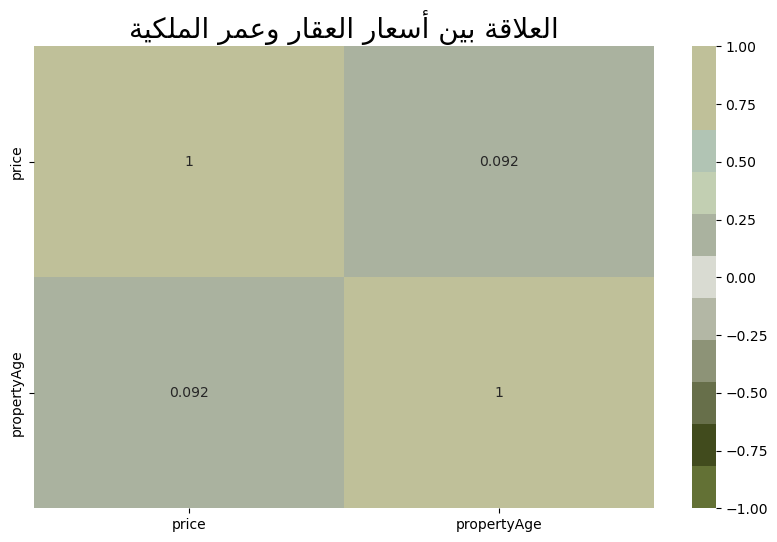

In [29]:
plt.figure(figsize=(10, 6)) 
custom_cmap = sns.color_palette(co)
heatmap=df[['price', 'propertyAge']]
sns.heatmap(heatmap.corr(),annot=True,vmin=-1,vmax=1,cmap=custom_cmap)

plt.title(get_display(arabic_reshaper.reshape('العلاقة بين أسعار العقار وعمر الملكية')),fontsize=20)
plt.show()

##  insight  :

### سعر الفلل لا يتأثر بشكل رئيسي بعمره بل يتأثر بموقعه أو مكانه

## Chart 8 : الاحياء الاكبر في عرض الشارع في شمال الرياض

In [30]:
Villa = df[df['location'] == 'شمال الرياض']
Villa = Villa[Villa['streetWidth'] >= 1]
Villa2 =Villa['neighbourhood'].value_counts().reset_index()
Villa2.columns = ['neighbourhood', 'streetWidth']
Villa2['location'] = 'شمال الرياض'
Villa3 = Villa2.head(10)
fig8 = px.bar(Villa3, x='neighbourhood', y='streetWidth', 
                   title=' الاحياء الاكبر في عرض الشارع في شمال الرياض ',
                   labels={'neighbourhood': 'الاحياء', 'streetWidth': 'العدد'},
                   color_discrete_sequence=co)
fig8.update_layout(
#     plot_bgcolor='rgb(245,245,245)',
    autosize=False,
    title = {'xanchor': 'center','x':0.5},
#     xaxis_title='السعر',
#     yaxis_title='عمر الملكية',
    title_font_size=24,
    
    font=dict(size=15),
    width=900,
    height=600,
)
fig8.show()

##  insight  :

### يساعد في فهم توزيع عرض الشوارع للفلل في شمال الرياض وكيف يختلف ذلك من حي لآخر
### يوضح تفضيلات سكان تلك المنطقة كما هو موضح تمركز الفلل في حي النرجس

## Chart 9 : العلاقة بين وجود حوض السباحة وعرض الشارع

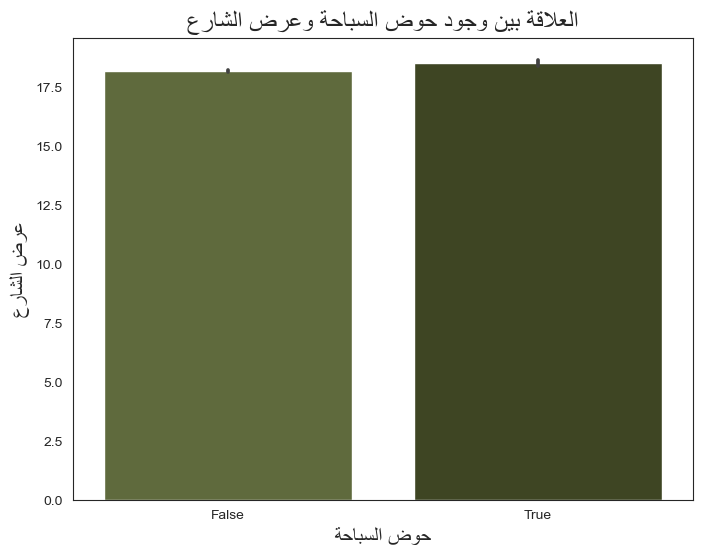

In [31]:
plt.figure(figsize=(8, 6)) 
sns.set_style("white")
fig9=sns.barplot(x='pool',y='streetWidth',data=df,palette=custom_cmap)
fig9.set_title(get_display(arabic_reshaper.reshape('العلاقة بين وجود حوض السباحة وعرض الشارع')),fontsize=18)
fig9.set_xlabel(get_display(arabic_reshaper.reshape('حوض السباحة')),fontsize=15)
fig9.set_ylabel(get_display(arabic_reshaper.reshape('عرض الشارع')),fontsize=15);


##  insight  :

###  تواجد المسابح يكون في الشوارع ذات عرض عالي وذلك لتفضيل سكانها على توفر مساحة عن بقية الفلل لكي يحضو بالخصوصية 

## Chart 10 : توزيع أحجام الفلل في المناطق

In [32]:
mean_space = df['space'].mean()

def c_villa(space):
    if space > mean_space:
        return 'مجموع الفلل الكبيره '
    else:
        return 'مجموع الفلل الصغيرة'

df['تصنيف الفلل'] = df['space'].apply(c_villa)

villa_counts = df.groupby(['location', 'تصنيف الفلل']).size().reset_index(name='عدد الفيلات')

bar_chart = px.bar(villa_counts, x='location', y='عدد الفيلات', color='تصنيف الفلل',color_discrete_sequence=co,
                   title='توزيع أحجام الفلل في المناطق',
                   labels={'location': 'الموقع', 'عدد الفيلات': 'عدد الفيلات'})
bar_chart.update_layout(
#     plot_bgcolor='rgb(245,245,245)',
    autosize=False,
    title = {'xanchor': 'center','x':0.5},
#     xaxis_title='السعر',
#     yaxis_title='عمر الملكية',
    title_font_size=24,
    
    font=dict(size=15),
    width=900,
    height=600,
)

bar_chart.show()

##  insight  :

### اختلاف التفكير السائد قديماً في شراء الفلل ذات المساحات العالية واتجاه الناس في اقتناء الفلل ذات الاحجام الصغيرة

In [37]:
df['duplex'] = df['duplex'].astype(str)
import dash
import base64
import dash_html_components as html
import dash_bootstrap_components as dbc
import dash_core_components as dcc
from dash.dependencies import Input, Output

app = dash.Dash(__name__, external_stylesheets=[dbc.themes.FLATLY])


# Calculate the mean price for each location
mean_prices = df.groupby('location')['price'].mean().reset_index()

figure1 = px.line(mean_prices, x='location', y='price', title='متوسط اسعار الفلل في مناطق الرياض',color_discrete_sequence=['darkgreen'])
figure1.update_layout(
plot_bgcolor='rgb(245,245,245)',
autosize=False,
title = {'xanchor': 'center','x':0.5},
xaxis_title='المنطقة',
yaxis_title='الأسعار',
title_font_size=24,
font=dict(size=15),
width=600,
height=400,
)








test_png = 'map.png'
test_base64 = base64.b64encode(open(test_png, 'rb').read()).decode('ascii')

app.layout = dbc.Container(
    fluid=True,
    style={'backgroundColor': '#dfdad3'},  # Set the background color here (light blue)
    children=[
        html.H1("عقارات الرياض", className='text-center', style={'color': 'black', 'fontSize': '40px'}),
        html.Img(src='data:image/png;base64,{}'.format(test_base64), width=100, height=100, className='d-block mx-auto'),
        html.Div([
            html.H3('من نحن', className='text-center', style={'color': 'black', 'marginTop': '30px'}),
        ]),
        html.H2("لوحة بيانات عقارات الرياض هو أداة لتصور البيانات تهدف إلى توفير نظرة مفصلة عن أسعار العقارات في الرياض. تحتوي لوحة البيانات على ثلاثة حقول إدخال: الموقع، الدبلكس، والسعر. يمكن للمستخدمين إدخال الموقع المطلوب، وتحديد ما إذا كانوا مهتمين بالعقارات من نوع الدبلكس، وتحديد نطاق الأسعار", className='text-center', style={'fontSize': '20px'}),
        html.Br(),
        html.Div(
            dcc.Graph(
                id='prices_per_location',
                figure=figure1,
                style={'height': '100%'}
            ),
            style={'display': 'flex', 'justify-content': 'center', 'align-items': 'center', 'height': '500px'}
        ),

        html.Div(
            [
                dbc.Row(
                    [
                        dbc.Col(html.Label('الموقع'), width='100'),
                        dbc.Col(dcc.Dropdown(id='dropdown1',options=[{'label':i , 'value':i} for i in df['location'].unique()]), width='75px'),
                    ],
                    className='align-items-center',
                ),html.P(''),
                dbc.Row(
                    [
                        dbc.Col(html.Label('دبلكس؟'), width='100'),
                        dbc.Col(dcc.Dropdown(id='dropdown2',options=[{'label':i , 'value':i} for i in df['duplex'].unique()]), width='75px'),
                    ],
                    className='align-items-center',
                ),
                dbc.Row(
                    [
                        dbc.Col(html.Label('الأسعار',style={'display': 'block', 'margin': 'auto'}), width='100'),
                        dbc.Col(dcc.Dropdown(id='dropdown3',options=[{'label':i , 'value':i} for i in df['category'].unique()]), width='75px'),
                    ],
                    className='align-items-center',
                ),
            ],
            style={'display': 'flex', 'justify-content': 'center', 'margin-top': '20px'},
        ),
        html.Br(),
        dcc.Graph(id='user_choice')

    ],
)

@app.callback(

    Output('user_choice','figure'),
    Input('dropdown1','value'),
    Input('dropdown2','value'),
    Input('dropdown3','value'),


)


def update_output(loc,d,p):
 
    location = df[(df['location'] == loc) & (df['duplex'] == d )&(df['category'] == p)]
    filtered_location = location
    mean_prices = filtered_location.groupby('neighbourhood')['price'].mean().reset_index()
    figg = px.line(mean_prices, x='neighbourhood', y='price', title='',color_discrete_sequence=['darkgreen'])
    figg.update_layout(
    plot_bgcolor='rgb(245,245,245)',
    xaxis_title='المنطقة',
    yaxis_title='الأسعار',
    title = {'xanchor': 'center','x':0.5},

        
    )

    return figg


app.run_server(port=3983)